In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf

import plotly.express as px
import statsmodels.api as sm
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from tensorflow import keras

from keras.layers import GRU, Dropout, SimpleRNN, LSTM, Dense, SimpleRNN, GRU
from keras.models import Sequential
from sklearn.preprocessing import MinMaxScaler

In [2]:
# Importing the dataset for training the models.
google_training_complete = pd.read_csv("Google_Stock_Train (2010-2022).csv")

In [3]:
google_training_complete

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-01-04,15.689439,15.753504,15.621622,15.684434,15.684434,78169752
1,2010-01-05,15.695195,15.711712,15.554054,15.615365,15.615365,120067812
2,2010-01-06,15.662162,15.662162,15.174174,15.221722,15.221722,158988852
3,2010-01-07,15.250250,15.265265,14.831081,14.867367,14.867367,256315428
4,2010-01-08,14.814815,15.096346,14.742492,15.065566,15.065566,188783028
...,...,...,...,...,...,...,...
3267,2022-12-23,87.110001,89.550003,87.070000,89.230003,89.230003,23003000
3268,2022-12-27,88.800003,88.940002,87.010002,87.389999,87.389999,20097300
3269,2022-12-28,86.980003,88.040001,85.940002,86.019997,86.019997,19523200
3270,2022-12-29,86.620003,88.849998,86.610001,88.449997,88.449997,23333500


Date: The date of the stock data, typically in YYYY-MM-DD format, representing the trading day.

Open: The price at which the stock opened at the beginning of the trading day.

High: The highest price reached by the stock during the trading day.

Low: The lowest price reached by the stock during the trading day.

Close: The price at which the stock closed at the end of the trading day.

Adj Close: The adjusted closing price, which accounts for factors like dividends and stock splits, providing a more accurate reflection of the stock’s value.

Volume: The total number of shares traded during the trading day, indicating the activity level of the stock.

# STEP -1 EDA

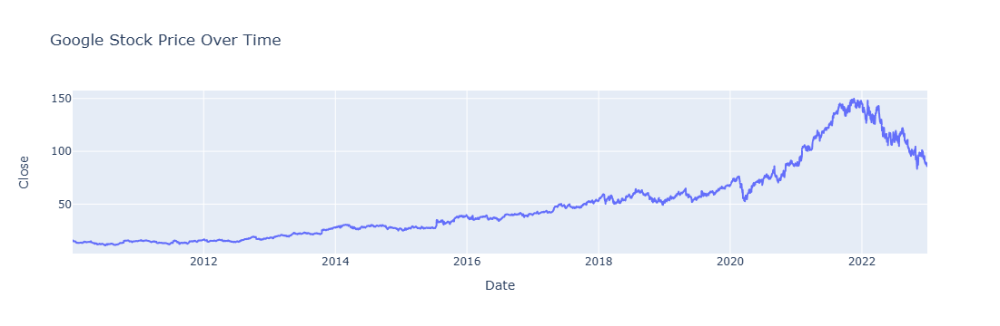

In [4]:
fig1 = px.line(google_training_complete, x='Date', y='Close', title='Google Stock Price Over Time')
fig1.show()

Purpose: Create a line chart of Google stock prices.

X-Axis: Represents dates from the 'Date' column.

Y-Axis: Represents closing prices from the 'Close' column.

Now we can analysis of how the stock's closing price has fluctuated over the specified period.

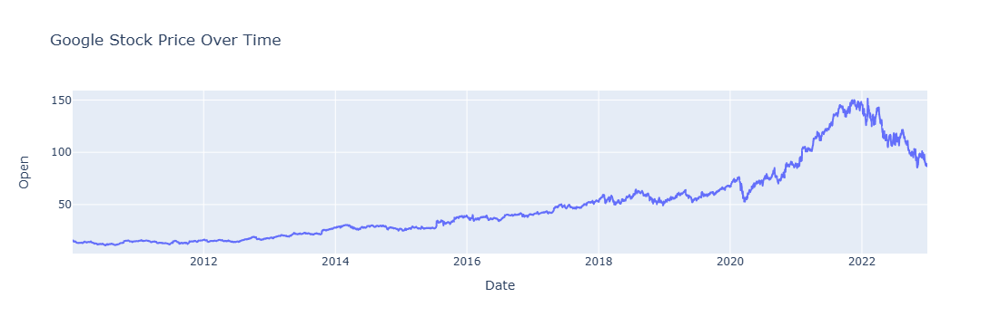

In [5]:
fig2 = px.line(google_training_complete, x='Date', y='Open', title='Google Stock Price Over Time')
fig2.show()

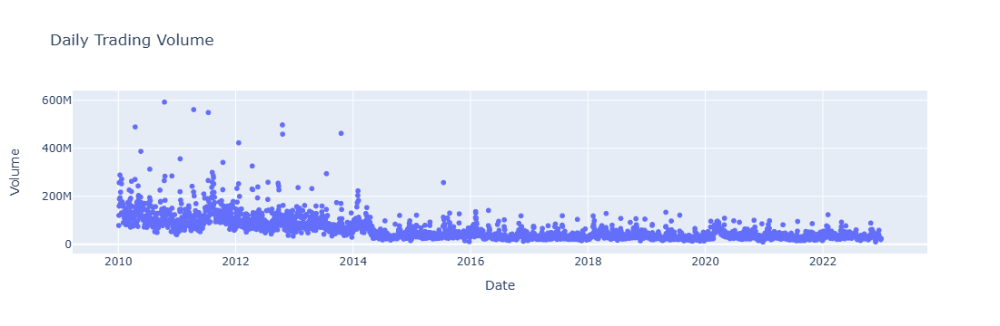

In [6]:
fig3 = px.scatter(google_training_complete, x='Date', y='Volume', title='Daily Trading Volume')
fig3.show()

scatter plot allows users to see the volume of shares traded on each date, helping to identify trends or patterns in trading activity over time

In [7]:
# Check the data type of the 'Date' column
column_type = google_training_complete['Date'].dtype
print(column_type)

object


In [8]:
# Convert 'Date' column to datetime format
google_training_complete['Date'] = pd.to_datetime(google_training_complete['Date'])
google_training_complete['Year'] = google_training_complete['Date'].dt.year

In [9]:
# Check the data type of the 'Date' column
column_type = google_training_complete['Date'].dtype
print(column_type)

datetime64[ns]


In [10]:
""" 
converts the 'Date' column from its original format into a pandas datetime object.
This ensures that the dates can be easily manipulated and analyzed 
(e.g., filtering, sorting, and performing date-based calculations).
"""

" \nconverts the 'Date' column from its original format into a pandas datetime object.\nThis ensures that the dates can be easily manipulated and analyzed \n(e.g., filtering, sorting, and performing date-based calculations).\n"

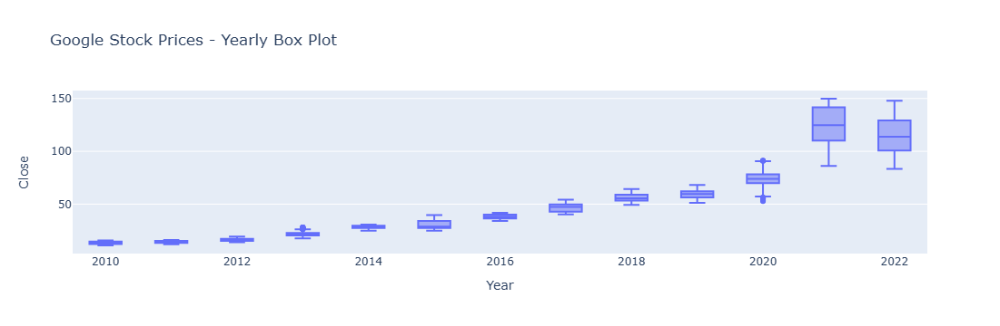

In [11]:
fig3 = px.box(google_training_complete, x='Year', y='Close', title='Google Stock Prices - Yearly Box Plot')
fig3.show()

By using a box plot, you can effectively separate the closing price data year-wise, allowing you to compute and analyze each year's performance based on key statistics:

Median: Provides a central tendency measure for each year, helping to understand typical performance.

Interquartile Range (IQR): indicate how spread out the middle 50% of the data is.

Maximum and Minimum Values: Help identify the range of closing prices, showing the extremes of performance for each year.

Outliers: Highlight unusual price movements.

and for Good performance we need:

Higher Median: Indicates that the closing price for the year is strong, reflecting better overall performance.

Smaller IQR: Suggests that the closing prices are less volatile and more stable, indicating consistent performance throughout the year.

Higher Upper Quartile (Q3): Shows that most closing prices are clustered towards the higher end, indicating a generally favorable price level for the stock.

In [12]:
google_training_complete['Date'] = google_training_complete['Date'].dt.strftime('%Y-%m-%d')

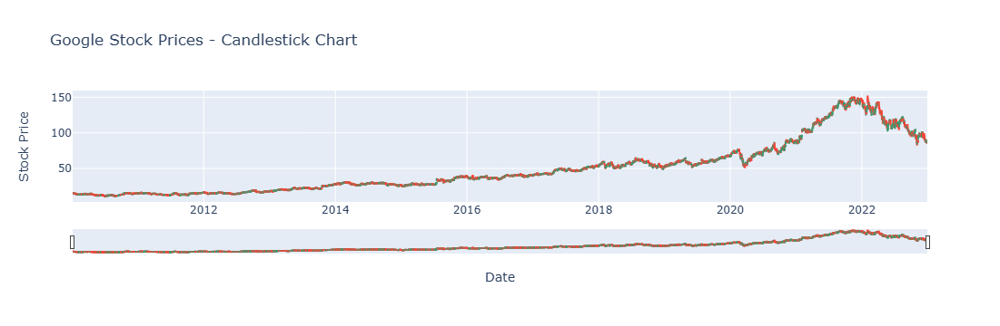

In [13]:
fig4 = go.Figure(data=[go.Candlestick(x=google_training_complete['Date'],
                                     open=google_training_complete['Open'],
                                     high=google_training_complete['High'],
                                     low=google_training_complete['Low'],
                                     close=google_training_complete['Close'])])

fig4.update_layout(title='Google Stock Prices - Candlestick Chart',
                   xaxis_title='Date',
                   yaxis_title='Stock Price')

fig4.show()

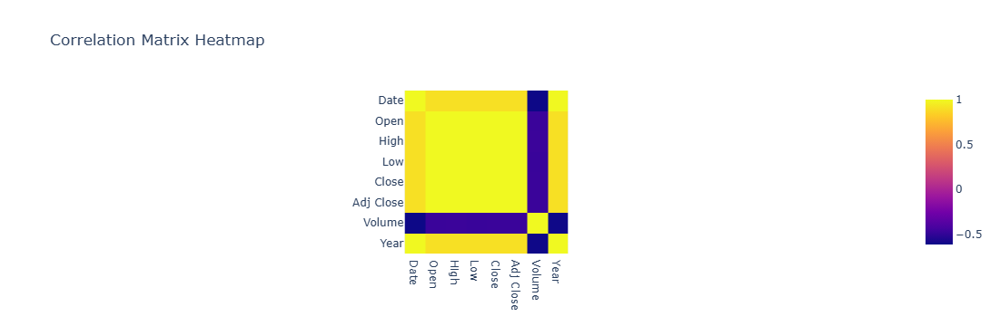

In [14]:
# Heatmap of correlation matrix
google_training_complete['Date'] = pd.to_datetime(google_training_complete['Date'])
correlation_matrix = google_training_complete.corr()
fig6 = px.imshow(correlation_matrix, x=correlation_matrix.index, y=correlation_matrix.columns, title='Correlation Matrix Heatmap')
fig6.show()

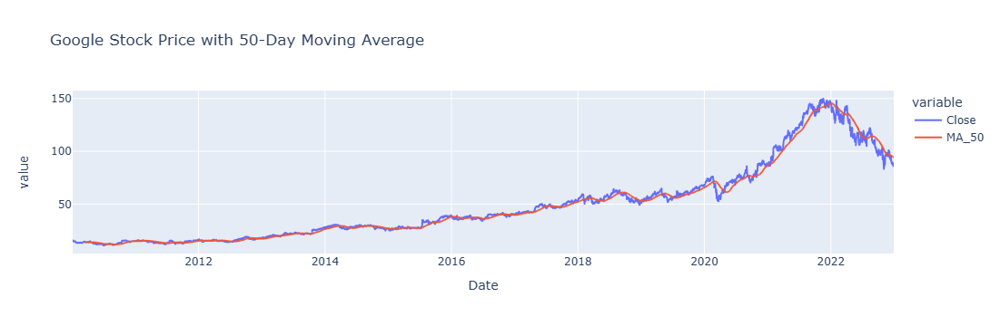

In [15]:
# Moving average of closing prices
google_training_complete['Date'] = google_training_complete['Date'].dt.strftime('%Y-%m-%d')
google_training_complete['MA_50'] = google_training_complete['Close'].rolling(window=50).mean()
fig7 = px.line(google_training_complete, x='Date', y=['Close', 'MA_50'], title='Google Stock Price with 50-Day Moving Average')
fig7.show()

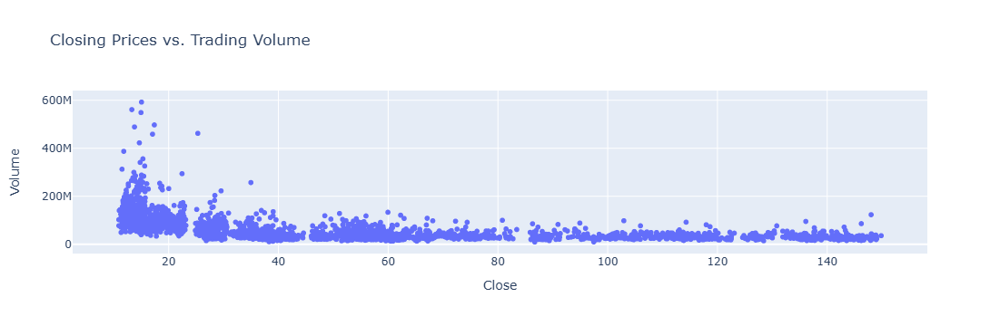

In [16]:
# Scatter plot of closing prices vs. trading volume
fig8 = px.scatter(google_training_complete, x='Close', y='Volume', title='Closing Prices vs. Trading Volume')
fig8.show()

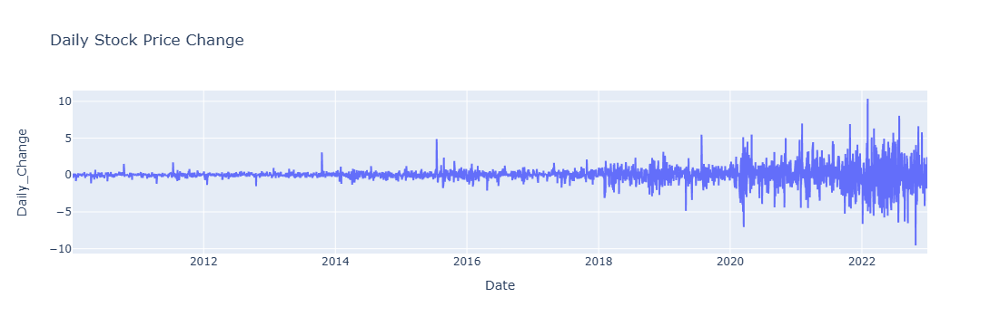

In [17]:
# Line chart for daily stock price change
google_training_complete['Daily_Change'] = google_training_complete['Close'].diff()
fig9 = px.line(google_training_complete, x='Date', y='Daily_Change', title='Daily Stock Price Change')
fig9.show()

In [18]:
google_training_complete['Daily_Change']

0            NaN
1      -0.069069
2      -0.393643
3      -0.354355
4       0.198199
          ...   
3267    1.470001
3268   -1.840004
3269   -1.370002
3270    2.430000
3271   -0.219994
Name: Daily_Change, Length: 3272, dtype: float64

In [19]:
google_training_complete['Close']

0       15.684434
1       15.615365
2       15.221722
3       14.867367
4       15.065566
          ...    
3267    89.230003
3268    87.389999
3269    86.019997
3270    88.449997
3271    88.230003
Name: Close, Length: 3272, dtype: float64

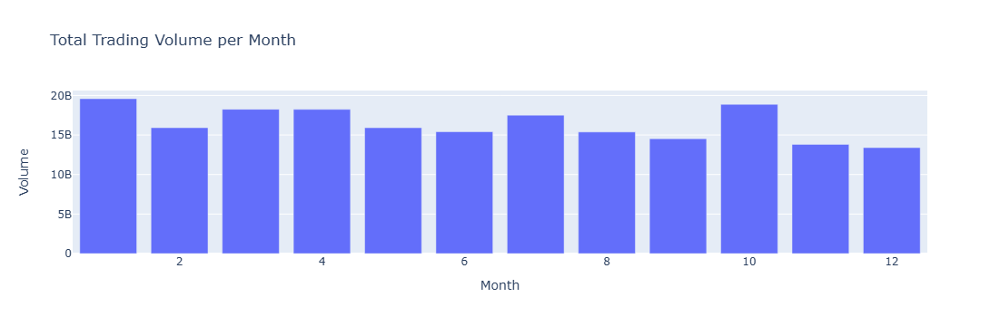

In [20]:
# Bar chart of trading volume per month
google_training_complete['Date'] = pd.to_datetime(google_training_complete['Date'])
google_training_complete['Month'] = google_training_complete['Date'].dt.month
monthly_volume = google_training_complete.groupby('Month')['Volume'].sum().reset_index()
fig10 = px.bar(monthly_volume, x='Month', y='Volume', title='Total Trading Volume per Month')
fig10.show()

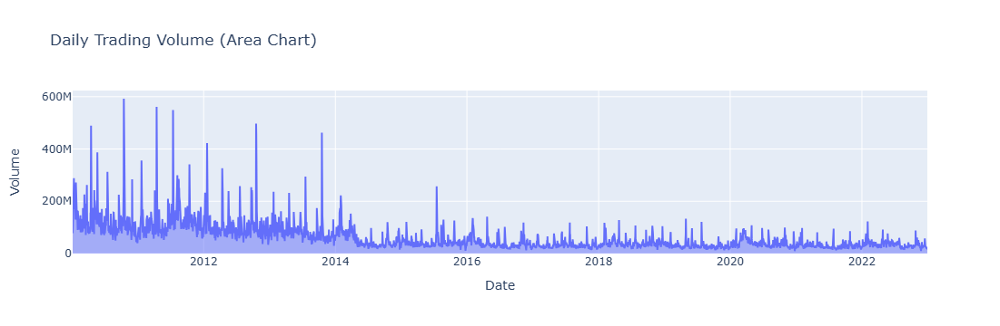

In [21]:
# Area chart for daily trading volume
google_training_complete['Date'] = google_training_complete['Date'].dt.strftime('%Y-%m-%d')
fig11 = px.area(google_training_complete, x='Date', y='Volume', title='Daily Trading Volume (Area Chart)')
fig11.show()

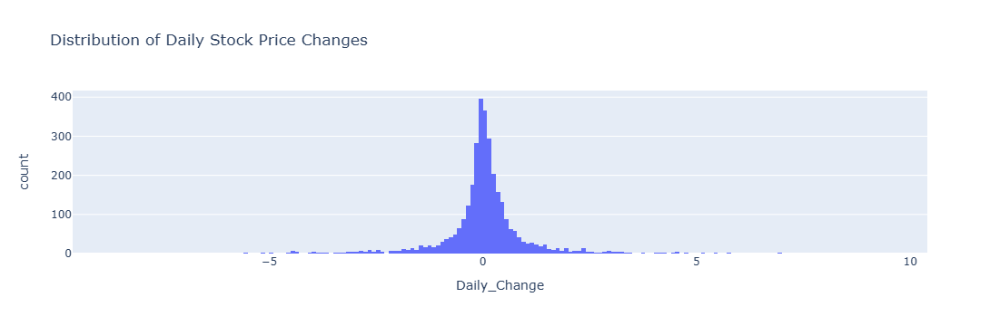

In [22]:
# Histogram of daily stock price changes
fig12 = px.histogram(google_training_complete, x='Daily_Change', title='Distribution of Daily Stock Price Changes')
fig12.show()

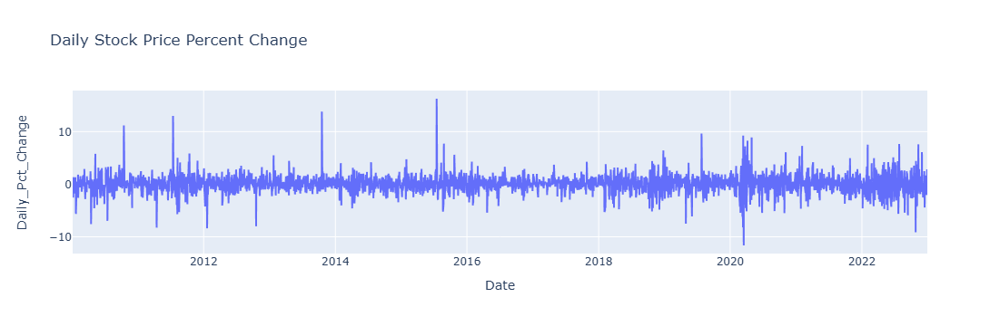

In [23]:
# Line chart for daily stock price percent change
google_training_complete['Daily_Pct_Change'] = google_training_complete['Close'].pct_change() * 100
fig13 = px.line(google_training_complete, x='Date', y='Daily_Pct_Change', title='Daily Stock Price Percent Change')
fig13.show()

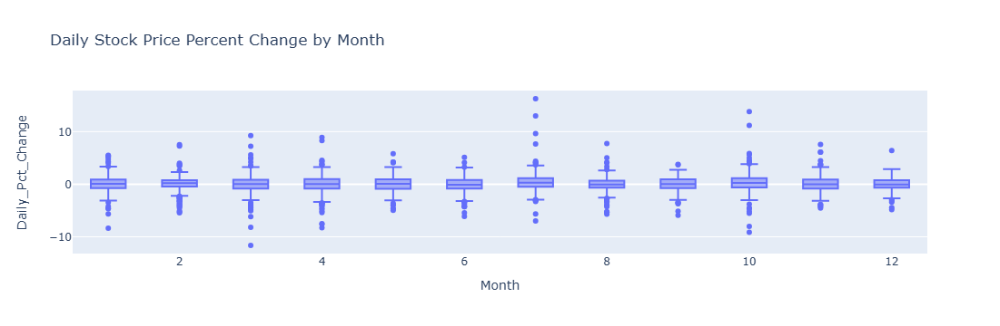

In [24]:
# Box plot of daily stock price percent change by month
fig14 = px.box(google_training_complete, x='Month', y='Daily_Pct_Change', title='Daily Stock Price Percent Change by Month')
fig14.show()

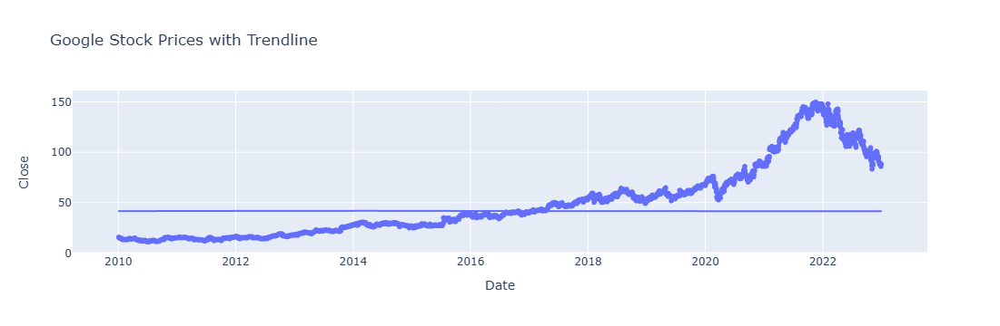

In [32]:
import pandas as pd
import plotly.express as px
import warnings

# Suppress future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Ensure the Date column is in datetime format
google_training_complete['Date'] = pd.to_datetime(google_training_complete['Date'])

# Create scatter plot with trendline
fig15 = px.scatter(
    google_training_complete,
    x=google_training_complete['Date'],  # Use the Date column directly
    y='Close',
    title='Google Stock Prices with Trendline',
    trendline='lowess'
)
fig15.show()

In [33]:
google_training_complete['Date'] = google_training_complete['Date'].dt.strftime('%Y-%m-%d')
google_training_complete['Date'] = pd.to_datetime(google_training_complete['Date'])

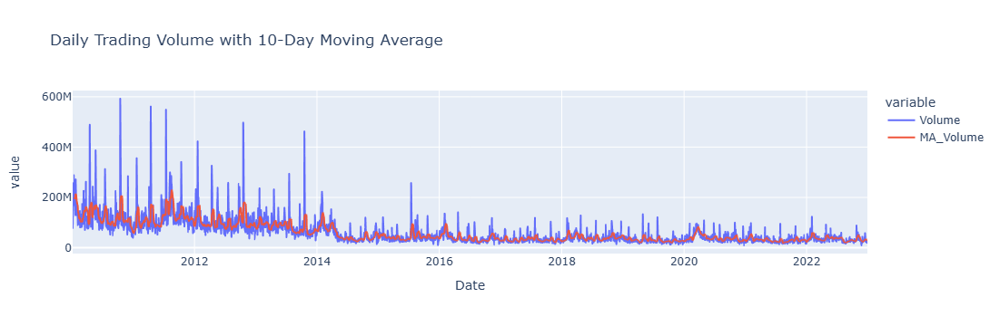

In [34]:
google_training_complete['MA_Volume'] = google_training_complete['Volume'].rolling(window=10).mean()
google_training_complete['Date'] = google_training_complete['Date'].dt.strftime('%Y-%m-%d')
fig16 = px.line(google_training_complete, x='Date', y=['Volume', 'MA_Volume'], title='Daily Trading Volume with 10-Day Moving Average')
fig16.show()

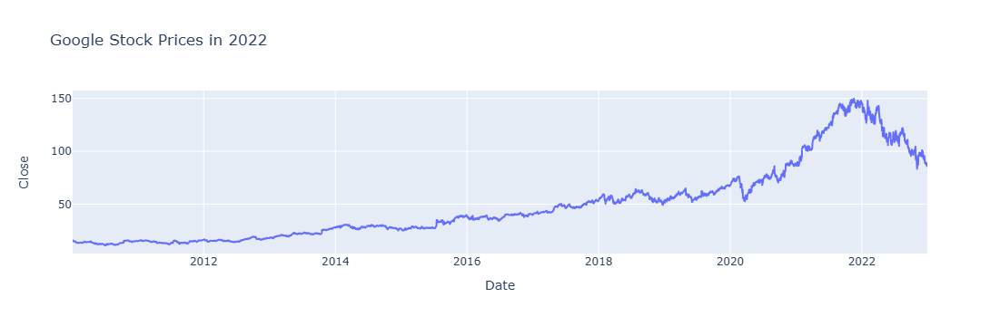

In [35]:
df_2022 = google_training_complete[google_training_complete['Year'] == 2022]
fig18 = px.line(google_training_complete, x='Date', y='Close', title='Google Stock Prices in 2022')
fig18.show()

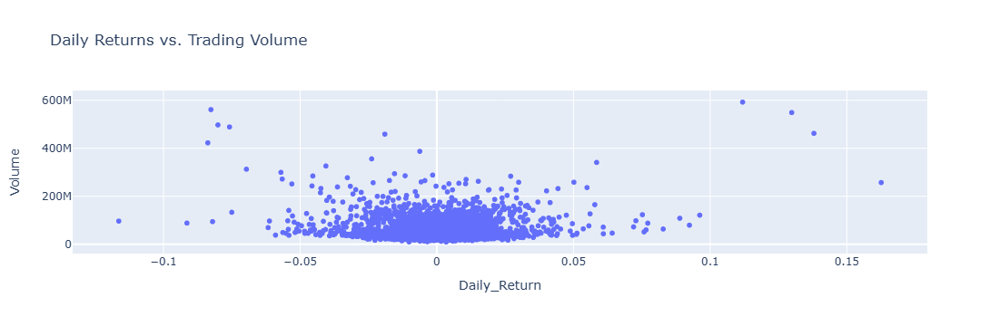

In [37]:
import pandas as pd
import plotly.express as px

# Ensure the Date column is in datetime format
google_training_complete['Date'] = pd.to_datetime(google_training_complete['Date'])

# Calculate daily returns
google_training_complete['Daily_Return'] = google_training_complete['Close'].pct_change()

# Create scatter plot of daily returns vs. trading volume
fig19 = px.scatter(
    google_training_complete,
    x='Daily_Return',
    y='Volume',
    title='Daily Returns vs. Trading Volume'
)
fig19.show()

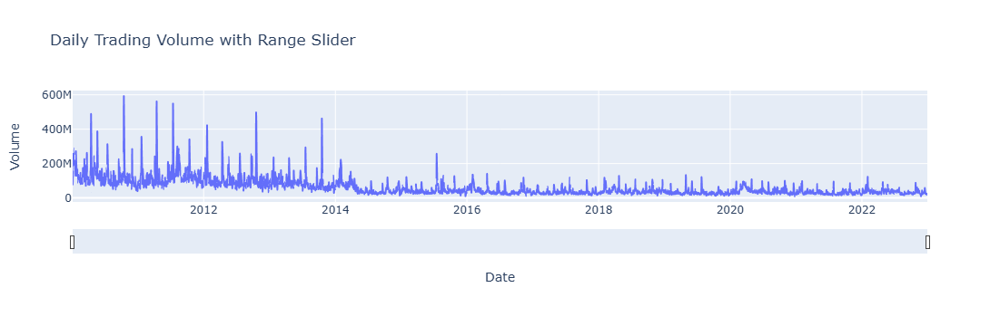

In [38]:
# Line chart for daily trading volume with range slider
fig20 = px.line(google_training_complete, x='Date', y='Volume', title='Daily Trading Volume with Range Slider')
fig20.update_xaxes(rangeslider_visible=True)
fig20.show()

# Step - 2 Data Processing 

In [39]:
google_training_processed = google_training_complete.iloc[:, 4:5].values
google_training_processed

array([[15.684434],
       [15.615365],
       [15.221722],
       ...,
       [86.019997],
       [88.449997],
       [88.230003]])

In [40]:
scaler = MinMaxScaler(feature_range = (0, 1))

In [41]:
google_training_scaled = scaler.fit_transform(google_training_processed)

In [42]:
print(google_training_scaled)
print(google_training_scaled.shape)

[[0.03434761]
 [0.03385045]
 [0.03101697]
 ...
 [0.54062898]
 [0.55812033]
 [0.55653679]]
(3272, 1)


In [43]:
features_set = []
labels = []
for i in range(60, google_training_scaled.shape[0]):
    features_set.append(google_training_scaled[i-60:i, 0])
    labels.append(google_training_scaled[i, 0])
type(features_set)

list

In [44]:
features_set = np.array(features_set)  
labels = np.array(labels)

In [45]:
features_set = np.reshape(features_set, (features_set.shape[0], features_set.shape[1], 1))
print(features_set.shape)

(3212, 60, 1)


LSTM layers work on 3D data with the following structure (nb_sequence, nb_timestep, nb_feature).eps.

where

nb_sequence corresponds to the total number of sequences in datset.

nb_timestep corresponds to the size of your sequences.

nb_feature corresponds to number of features describing each of your timesteps.

# RNN

In [47]:
from keras.models import Sequential
from keras.layers import SimpleRNN, Dropout, Dense, Input

# Building the RNN model
RNN_model = Sequential()
RNN_model.add(Input(shape=(features_set.shape[1], 1)))  # Use Input layer as the first layer
RNN_model.add(SimpleRNN(units=300, return_sequences=True))
RNN_model.add(Dropout(0.2))

RNN_model.add(SimpleRNN(units=100, return_sequences=True))
RNN_model.add(Dropout(0.2))

RNN_model.add(SimpleRNN(units=100, return_sequences=True))
RNN_model.add(Dropout(0.2))

RNN_model.add(SimpleRNN(units=100))
RNN_model.add(Dropout(0.2))

RNN_model.add(Dense(units=1))

In [48]:
## Here we are compling the model,
RNN_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
RNN_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ simple_rnn_4 (SimpleRNN)             │ (None, 60, 300)             │          90,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 60, 300)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn_5 (SimpleRNN)             │ (None, 60, 100)             │          40,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 60, 100)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn_6 (SimpleRNN)             │ (None, 60, 100)             │          20,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 60, 100)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ simple_rnn_7 (SimpleRNN)             │ (None, 100)                 │          20,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 171,001 (667.97 KB)

 Trainable params: 171,001 (667.97 KB)

 Non-trainable params: 0 (0.00 B)

In [49]:
## Training the model over the dataset.
RNN_History = RNN_model.fit(features_set, labels, epochs = 100, batch_size = 32)

Epoch 1/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step - loss: 0.6334
Epoch 2/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.2984
Epoch 3/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.2286
Epoch 4/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - loss: 0.1700
Epoch 5/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step - loss: 0.1478
Epoch 6/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 6s 55ms/step - loss: 0.1233
Epoch 7/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 0.1189
Epoch 8/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step - loss: 0.0963
Epoch 9/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step - loss: 0.0943
Epoch 10/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0858
Epoch 11/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 7s 69ms/step - loss: 0.0813
Epoch 12/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - loss: 0.0774
Epoch 13/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step - loss: 0.0771
Epoch 14/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 7s 71ms/step - loss: 0.0736
Epoch 15/100
101/101 ━━━━━━━

In [50]:
# Now it time for LSTM

# LSTM

In [51]:
## Building the model 
LSTM_model = Sequential()
LSTM_model.add(LSTM(units=300, return_sequences=True, input_shape=(features_set.shape[1], 1)))
LSTM_model.add(Dropout(0.2))

LSTM_model.add(LSTM(units=100, return_sequences=True))
LSTM_model.add(Dropout(0.2))

LSTM_model.add(LSTM(units=100, return_sequences=True))
LSTM_model.add(Dropout(0.2))

LSTM_model.add(LSTM(units=100))
LSTM_model.add(Dropout(0.2))

LSTM_model.add(Dense(units = 1))

In [52]:
## Compiling the model 
LSTM_model.compile(optimizer = 'adam', loss = 'mean_squared_error')
LSTM_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 60, 300)             │         362,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 60, 300)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 60, 100)             │         160,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 60, 100)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 60, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 60, 100)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 100)                 │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 683,701 (2.61 MB)

 Trainable params: 683,701 (2.61 MB)

 Non-trainable params: 0 (0.00 B)

In [53]:
## Training the model over the dataset.
LSTM_History = LSTM_model.fit(features_set, labels, epochs = 100, batch_size = 32)

Epoch 1/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 25s 169ms/step - loss: 0.0131
Epoch 2/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0014
Epoch 3/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0013
Epoch 4/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0014
Epoch 5/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0011
Epoch 6/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0015
Epoch 7/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 9.3501e-04
Epoch 8/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0011
Epoch 9/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0011
Epoch 10/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 9.0746e-04
Epoch 11/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0012
Epoch 12/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0013
Epoch 13/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0011
Epoch 14/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 

In [54]:
## Now for the GRU

# GRU

In [55]:
## building the model
GRU_model = Sequential()
GRU_model.add(GRU(units=300, return_sequences=True, input_shape=(features_set.shape[1], 1)))
GRU_model.add(Dropout(0.2))

GRU_model.add(GRU(units=100, return_sequences=True))
GRU_model.add(Dropout(0.2))

GRU_model.add(GRU(units=100, return_sequences=True))
GRU_model.add(Dropout(0.2))

GRU_model.add(GRU(units=100))
GRU_model.add(Dropout(0.2))

GRU_model.add(Dense(units = 1))

In [56]:
## compling the model 
GRU_model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [57]:
GRU_model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ gru (GRU)                            │ (None, 60, 300)             │         272,700 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 60, 300)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_1 (GRU)                          │ (None, 60, 100)             │         120,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 60, 100)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_2 (GRU)                          │ (None, 60, 100)             │          60,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_14 (Dropout)                 │ (None, 60, 100)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gru_3 (GRU)                          │ (None, 100)                 │          60,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_15 (Dropout)                 │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 514,601 (1.96 MB)

 Trainable params: 514,601 (1.96 MB)

 Non-trainable params: 0 (0.00 B)

In [58]:
## training the model
GRU_History = GRU_model.fit(features_set, labels, epochs = 100, batch_size = 32)

Epoch 1/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0191
Epoch 2/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0013
Epoch 3/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0014
Epoch 4/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 17s 169ms/step - loss: 0.0012
Epoch 5/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0012
Epoch 6/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0012
Epoch 7/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0011
Epoch 8/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0010
Epoch 9/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 7.4193e-04
Epoch 10/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 9.6563e-04
Epoch 11/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 9.2293e-04
Epoch 12/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0012
Epoch 13/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0011
Epoch 14/100
101/101 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - lo

## Evaluate The Model

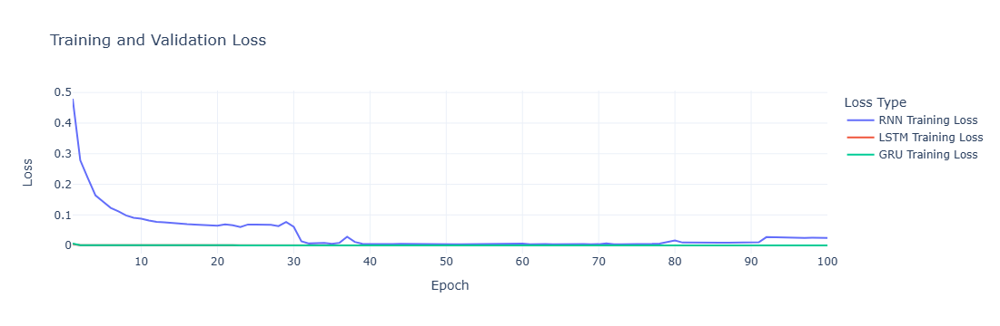

In [59]:
fig = go.Figure()
# Training loss trace

fig.add_trace(go.Scatter(x=list(range(1, len(RNN_History.history['loss']) + 1)), 
                         y=RNN_History.history['loss'],
                         mode='lines',
                         name='RNN Training Loss'))
fig.add_trace(go.Scatter(x=list(range(1, len(LSTM_History.history['loss']) + 1)), 
                         y=LSTM_History.history['loss'],
                         mode='lines',
                         name='LSTM Training Loss'))
fig.add_trace(go.Scatter(x=list(range(1, len(GRU_History.history['loss']) + 1)), 
                         y=GRU_History.history['loss'],
                         mode='lines',
                         name='GRU Training Loss'))
fig.update_layout(title='Training and Validation Loss',
                  xaxis_title='Epoch',
                  yaxis_title='Loss',
                  legend_title='Loss Type',
                  hovermode='x',
                  hoverlabel=dict(bgcolor='white', font_size=12, font_family='Rockwell'),
                  template='plotly_white')
fig.show()

## Evalute Model Prediction

In [60]:
## Now Load the Test data 
google_testing_complete = pd.read_csv("Google_Stock_Test (2023).csv")
google_testing_processed = google_testing_complete.iloc[:, 1:2].values

In [61]:
google_total = pd.concat((google_training_complete['Close'], google_testing_complete['Close']), axis=0)

In [62]:
google_total

0       15.684434
1       15.615365
2       15.221722
3       14.867367
4       15.065566
          ...    
138    121.529999
139    122.209999
140    129.270004
141    129.399994
142    132.580002
Name: Close, Length: 3415, dtype: float64

In [63]:
test_inputs = google_total[len(google_total) - len(google_testing_complete) - 60:].values
test_inputs

array([101.419998,  98.68    ,  97.860001,  97.18    ,  97.559998,
        99.059998,  96.559998,  99.970001, 100.769997,  99.629997,
        99.970001, 101.129997, 102.519997, 104.480003,  94.93    ,
        92.220001,  96.290001,  94.510002,  90.470001,  86.970001,
        83.43    ,  86.580002,  88.489998,  88.900002,  87.32    ,
        93.940002,  96.410004,  95.699997,  98.440002,  98.849998,
        98.360001,  97.43    ,  95.599998,  97.050003,  98.459999,
        97.459999,  96.050003,  95.190002, 100.989998, 100.989998,
       100.440002,  99.480003,  96.980003,  94.940002,  93.709999,
        92.830002,  93.309998,  95.629997,  95.07    ,  90.860001,
        90.260002,  88.440002,  89.019997,  89.580002,  87.760002,
        89.230003,  87.389999,  86.019997,  88.449997,  88.230003,
        89.120003,  88.080002,  86.199997,  87.339996,  88.019997,
        88.419998,  91.519997,  91.129997,  92.120003,  91.290001,
        91.120003,  93.050003,  98.019997,  99.790001,  97.699

In [64]:
test_inputs = test_inputs.reshape(-1,1)
test_inputs = scaler.transform(test_inputs)

test_features = []
for i in range(60, len(test_inputs)):
    test_features.append(test_inputs[i-60:i, 0])
    
test_features = np.array(test_features)
test_features = np.reshape(test_features, (test_features.shape[0], test_features.shape[1], 1))
test_features.shape

(143, 60, 1)

# Evaluate the model on the test set

In [65]:
## RNN
RNN_test_loss = RNN_model.evaluate(test_features, google_testing_processed)
print(f'RNN Test Loss: {RNN_test_loss}')

## LSTM
LSTM_test_loss = LSTM_model.evaluate(test_features, google_testing_processed)
print(f'LSTM Test Loss: {LSTM_test_loss}')

## GRU
GRU_test_loss = GRU_model.evaluate(test_features, google_testing_processed)
print(f'GRU Test Loss: {GRU_test_loss}')

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 10381.2314
RNN Test Loss: 11579.0205078125
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 10367.2520
LSTM Test Loss: 11555.1025390625
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 10369.4707
GRU Test Loss: 11557.7373046875


## Make Prediction

In [66]:
# RNN
RNN_predictions = RNN_model.predict(test_features)
RNN_predictions = scaler.inverse_transform(RNN_predictions)

# LSTM
LSTM_predictions = LSTM_model.predict(test_features)
LSTM_predictions = scaler.inverse_transform(LSTM_predictions)

# GRU
GRU_predictions = GRU_model.predict(test_features)
GRU_predictions = scaler.inverse_transform(GRU_predictions)

5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 223ms/step
4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/stepWARNING:tensorflow:5 out of the last 11 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000002755BD1E480> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 251ms/step


In [67]:
google_testing_complete

,Date,Open,High,Low,Close,Adj Close,Volume
0,2023-01-03,89.589996,91.050003,88.519997,89.120003,89.120003,28131200
1,2023-01-04,90.349998,90.650002,87.269997,88.080002,88.080002,34854800
2,2023-01-05,87.470001,87.570000,85.900002,86.199997,86.199997,27194400
3,2023-01-06,86.790001,87.690002,84.860001,87.339996,87.339996,41381500
4,2023-01-09,88.360001,90.050003,87.860001,88.019997,88.019997,29003900
...,...,...,...,...,...,...,...
138,2023-07-24,121.660004,123.000000,120.980003,121.529999,121.529999,29686100
139,2023-07-25,121.360001,123.150002,121.019997,122.209999,122.209999,52509600
140,2023-07-26,130.070007,130.979996,128.320007,129.270004,129.270004,61682100
141,2023-07-27,131.669998,133.240005,128.789993,129.399994,129.399994,44952100


In [68]:
google_prediction = google_testing_complete['Date']
google_prediction = pd.DataFrame(google_prediction)
google_prediction['RNN_Open'] = RNN_predictions
google_prediction['LSTM_Open'] = LSTM_predictions
google_prediction['GRU_Open'] = GRU_predictions

google_prediction

,Date,RNN_Open,LSTM_Open,GRU_Open
0,2023-01-03,94.648811,88.312180,89.180283
1,2023-01-04,94.648811,88.867462,89.499741
2,2023-01-05,94.648811,88.450134,89.341324
3,2023-01-06,94.648811,87.060982,87.767876
4,2023-01-09,94.648811,87.024193,88.238617
...,...,...,...,...
138,2023-07-24,94.648903,122.401657,120.250038
139,2023-07-25,94.648903,123.371269,121.583458
140,2023-07-26,94.648911,124.093773,122.026360
141,2023-07-27,94.648911,128.164642,127.034760


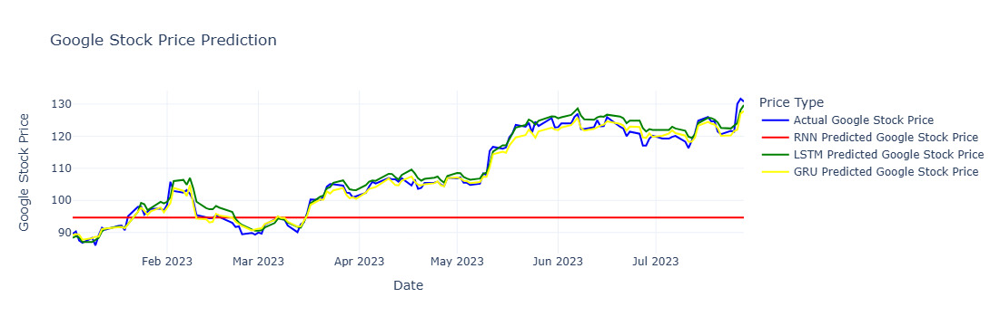

In [69]:
fig = go.Figure()

# Actual Apple stock price trace
fig.add_trace(go.Scatter(x=google_testing_complete.Date,
                         y=google_testing_complete.Open,
                         mode='lines',
                         name='Actual Google Stock Price',
                         line=dict(color='blue')))

# RNN Predicted Apple stock price trace
fig.add_trace(go.Scatter(x=google_prediction.Date,
                         y=google_prediction.RNN_Open,
                         mode='lines',
                         name='RNN Predicted Google Stock Price',
                         line=dict(color='red')))
# LSTM Predicted Apple stock price trace
fig.add_trace(go.Scatter(x=google_prediction.Date,
                         y=google_prediction.LSTM_Open,
                         mode='lines',
                         name='LSTM Predicted Google Stock Price',
                         line=dict(color='green')))

# LSTM Predicted Apple stock price trace
fig.add_trace(go.Scatter(x=google_prediction.Date,
                         y=google_prediction.GRU_Open,
                         mode='lines',
                         name='GRU Predicted Google Stock Price',
                         line=dict(color='yellow')))

fig.update_layout(title='Google Stock Price Prediction',
                  xaxis_title='Date',
                  yaxis_title='Google Stock Price',
                  legend_title='Price Type',
                  hovermode='x',
                  hoverlabel=dict(bgcolor='white', font_size=12, font_family='Rockwell'),
                  template='plotly_white')

fig.show()